# Analysis for Figure3

In [1]:
import warnings
import os
import sys
import gc
import warnings

In [2]:
import anndata as ad
import scanpy as sc
import scanpy.external as sce
import copy
import torch
from pathlib import Path
import networkx as nx
from sklearn.neighbors import kneighbors_graph
import numpy as np
import rapids_singlecell as rsc
import scanpy as sc
import cupyx as cpx
import pandas as pd
import numpy as np
import scipy.stats
import statsmodels.api as sm
from statsmodels.formula.api import ols
import scib
import scib_metrics
import palantir

sys.path.append("/home/icb/kemal.inecik/work/codes/tardis")
import tardis
tardis.config = tardis.config_server

sc.settings.verbosity = 3

print(f"CUDA used: {torch.cuda.is_available()}")

/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/umap/__init__.py:9: ImportWarning: Tensorflow not installed; ParametricUMAP will be unavailable
  warn(
/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/xla.py:18: DeprecationWarning: `ModuleAvailableCache` is a special case of `RequirementCache`. Please use `RequirementCache(module=...)` instead.
  from lightning.fabric.accelerators.tpu import _XLA_AVAILABLE, TPUAccelerator
/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/__init__.py:36: DeprecationWarning: Deprecated call to `pkg_resources.declare_namespace('lightning.fabric')`.
Implementing implicit namespace packages (as specified in PEP 420) is preferred to `pkg_resources.declare_namespace`. See https://setuptools.pypa.io/en/latest/references/keywords.html#keyword-namespace-packages
  __import__("pkg_resources").declare_na

CUDA used: True


In [3]:
%matplotlib inline
%config InlineBackend.figure_format='retina'
import matplotlib.pyplot as plt
import seaborn as sns

import pickle
_rcparams_path = "/home/icb/kemal.inecik/work/codes/tardis/training/local/figures/rcparams.pickle"
with open(_rcparams_path, 'rb') as file:
    _rcparams = pickle.load(file)
plt.rcParams.update(_rcparams)

/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/matplotlib_inline/config.py:68: DeprecationWarning: InlineBackend._figure_format_changed is deprecated in traitlets 4.1: use @observe and @unobserve instead.
  def _figure_format_changed(self, name, old, new):


In [4]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    adata_file_path = os.path.join(tardis.config.io_directories["processed"], "dataset_complete_Suo_age.h5ad")
    assert os.path.isfile(adata_file_path), f"File not already exist: `{adata_file_path}`"
    adata = ad.read_h5ad(adata_file_path)
    adata.obs["age"] = adata.obs["age"].astype(float)
    adata.obs["age_categorical"] = adata.obs["age"].astype(str)
    d = {i: ind for ind, i in enumerate(sorted(adata.obs["age"].astype(float).unique()))}
    adata.obs["age_training"] = [d[float(i)] for i in adata.obs["age"]]

In [5]:
adata_file_path_large = (
    "/lustre/groups/ml01/workspace/kemal.inecik/hdca/" 
    "temp/preprocessing/unification_union_20240330_hvg.h5ad"
)
complete_varnames = ad.read_h5ad(adata_file_path_large, backed='r').var.copy()
adata_var_pickle = os.path.join(tardis.config.io_directories["processed"], "dataset_complete_Suo_varnames.pickle")
adata.var = complete_varnames.loc[pd.read_pickle(adata_var_pickle).index]

In [88]:
dir_path = os.path.join(
    tardis.config.io_directories["models"],
    "suo_age-continuous_6_encode"
)
vae = tardis.MyModel.load(dir_path, adata=adata)

INFO     File /lustre/groups/ml01/workspace/kemal.inecik/tardis_data/models/suo_age-continuous_6_encode/model.pt   
         already downloaded                                                                                        


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/scvi/model/base/_base_model.py:683: UserWarning: var_names for adata passed in does not match var_names of adata used to train the model. For valid results, the vars need to be the same and in the same order as the adata used to train the model.
  _validate_var_names(adata, var_names)


In [89]:
latent = ad.AnnData(X=vae.get_latent_representation(), obs=adata.obs.copy())
rsc.utils.anndata_to_GPU(latent)
rsc.pp.neighbors(adata=latent, n_neighbors = 30)
rsc.tl.umap(adata=latent)

/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/cupy/sparse/__init__.py:17: DeprecationWarning: cupy.sparse is deprecated. Use cupyx.scipy.sparse instead.
  warnings.warn(msg, DeprecationWarning)


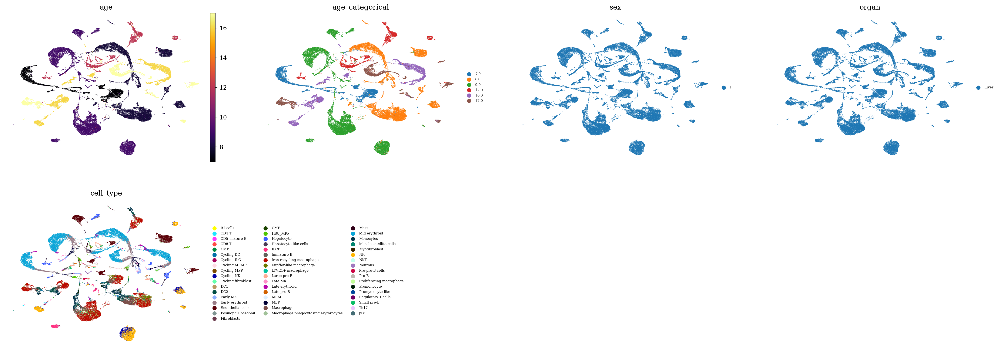

In [90]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent,
        color=["age", "age_categorical", "sex", "organ", "cell_type"],
        ncols=4,
        color_map="inferno",
        frameon=False,
        legend_fontsize="xx-small",
        show=False,
    )
    plt.show()
    # del latent
    # gc.collect()

In [91]:
batch_size_vae_metrics = 512

vae_metrics = {
    "reconstruction_error": vae.get_reconstruction_error(batch_size=batch_size_vae_metrics)['reconstruction_loss'],
    "elbo": vae.get_elbo(batch_size=batch_size_vae_metrics).item(),
    "r2_train": vae.get_reconstruction_r2(batch_size=batch_size_vae_metrics, indices=vae.train_indices),
    "r2_validation": vae.get_reconstruction_r2(batch_size=batch_size_vae_metrics, indices=vae.validation_indices),
}
for k, v in vae_metrics.items():
    print(k, v)

reconstruction_error -388.77785667157417
elbo -429.3507080078125
r2_train 0.9820769979360363
r2_validation 0.9827549832342029


In [92]:
from tardis._disentanglementmanager import DisentanglementManager

In [93]:
latent = ad.AnnData(X=vae.get_latent_representation()[:, DisentanglementManager.configurations.get_by_obs_key("age_training").reserved_latent_indices], obs=adata.obs.copy())
sc.tl.pca(latent, n_comps=7)
dm_res = palantir.utils.run_diffusion_maps(latent, n_components=5, knn = 30)
ms_data = palantir.utils.determine_multiscale_space(latent)

computing PCA
    with n_comps=7
    finished (0:00:00)
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:13)


In [94]:
rsc.utils.anndata_to_GPU(latent)
rsc.pp.neighbors(adata=latent, n_neighbors = 30)
rsc.tl.umap(adata=latent)

/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/cupy/sparse/__init__.py:17: DeprecationWarning: cupy.sparse is deprecated. Use cupyx.scipy.sparse instead.
  warnings.warn(msg, DeprecationWarning)


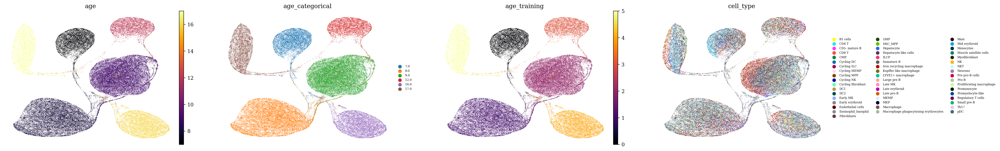

In [95]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent,
        color=["age", "age_categorical", "age_training", "cell_type"],
        ncols=4,
        color_map="inferno",
        frameon=False,
        legend_fontsize="xx-small",
        show=False,
    )
    plt.show()

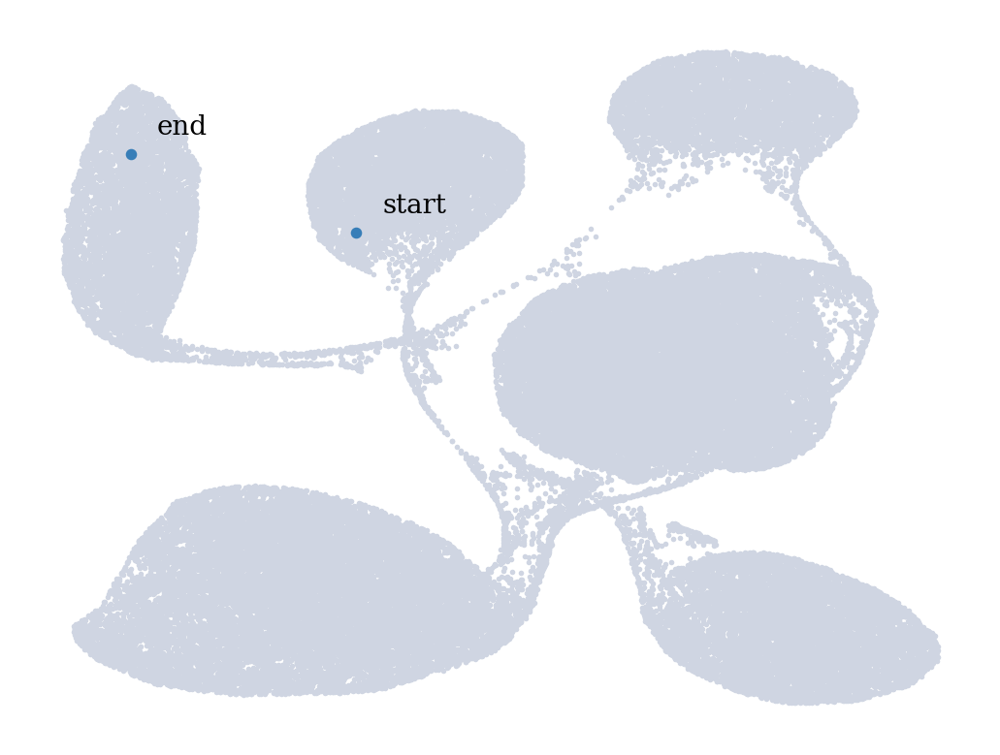

In [96]:
start_cell = latent.obs.index[np.where([latent.obs["age"] == latent.obs["age"].min()])[1][1]]
end_cell = latent.obs.index[np.where([latent.obs["age"] == latent.obs["age"].max()])[1][10]]

terminal_states = pd.Series(
    ["start", "end"],
    index=[start_cell, end_cell],
)

palantir.plot.highlight_cells_on_umap(latent, terminal_states)
plt.show()

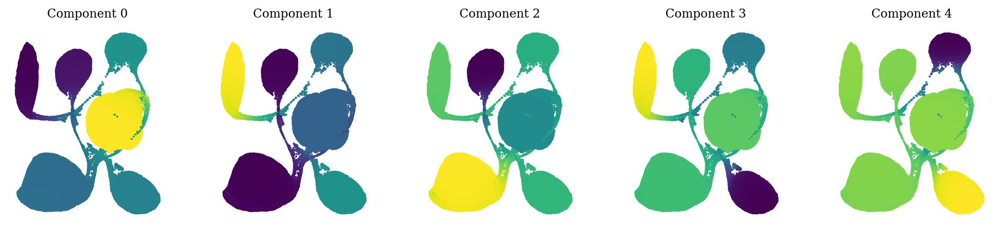

In [97]:
palantir.plot.plot_diffusion_components(latent)
plt.show()

In [98]:
latent

AnnData object with n_obs × n_vars = 73697 × 8
    obs: 'sample_ID', 'organ', 'age', 'cell_type', 'sex', 'sex_inferred', 'concatenated_integration_covariates', 'integration_donor', 'integration_biological_unit', 'integration_sample_status', 'integration_library_platform_coarse', 'n_genes', 'age_categorical', 'age_training', '_scvi_batch', '_scvi_labels'
    uns: 'pca', 'DM_EigenValues', 'neighbors', 'umap', 'age_categorical_colors', 'cell_type_colors'
    obsm: 'X_pca', 'DM_EigenVectors', 'DM_EigenVectors_multiscaled', 'X_umap'
    varm: 'PCs'
    obsp: 'DM_Kernel', 'DM_Similarity', 'distances', 'connectivities'

In [99]:
pr_res = palantir.core.run_palantir(
    latent, 
    start_cell, terminal_states=terminal_states,
    knn=30
)

Sampling and flocking waypoints...
Time for determining waypoints: 0.40761077801386514 minutes
Determining pseudotime...
Shortest path distances using 30-nearest neighbor graph...
Time for shortest paths: 1.2221200903256735 minutes
Iteratively refining the pseudotime...
Correlation at iteration 1: 1.0000
Entropy and branch probabilities...
Markov chain construction...
Computing fundamental matrix and absorption probabilities...
Project results to all cells...


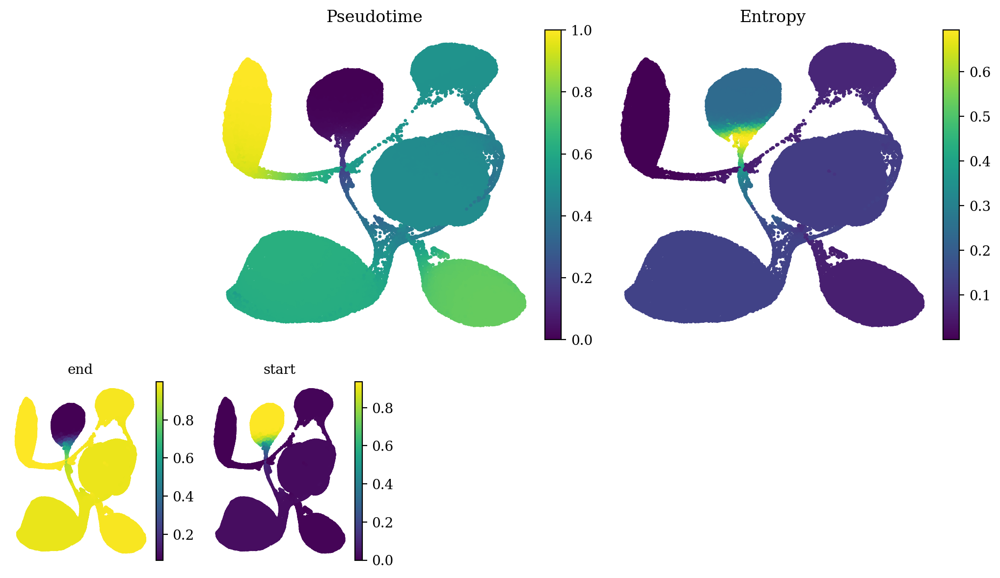

In [100]:
palantir.plot.plot_palantir_results(latent, s=2)
plt.show()

/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


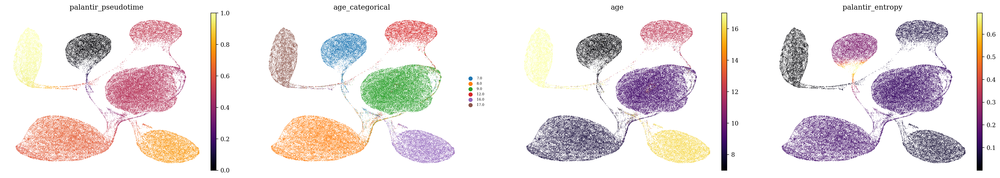

In [101]:
sc.pl.umap(
    latent,
    color=["palantir_pseudotime", "age_categorical", "age", "palantir_entropy"],
    ncols=5,
    color_map="inferno",
    frameon=False,
    legend_fontsize="xx-small",
    show=False,
)
plt.show()

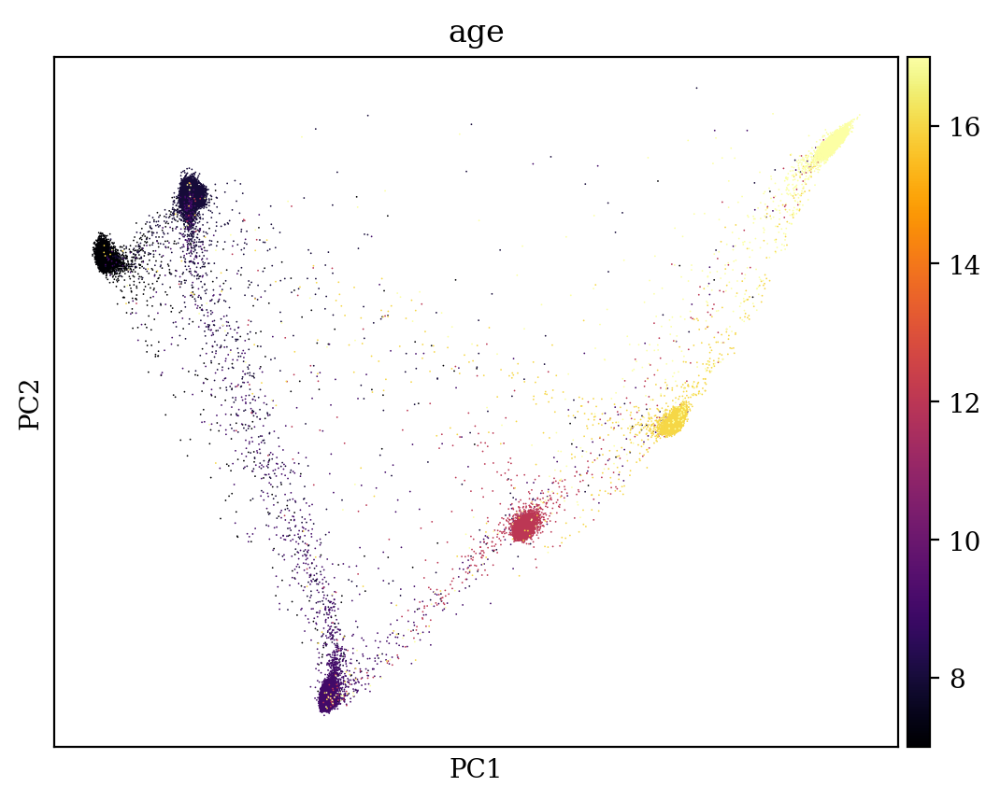

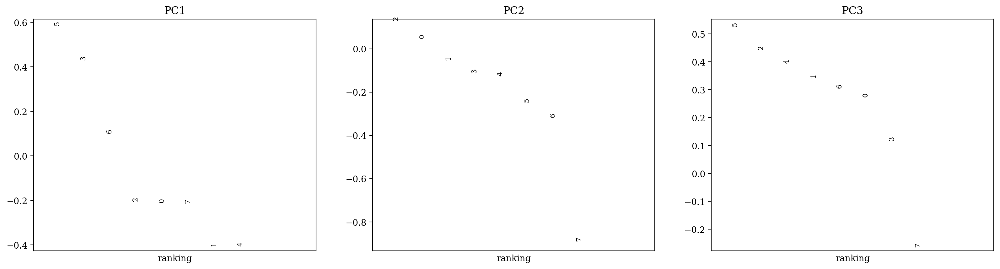

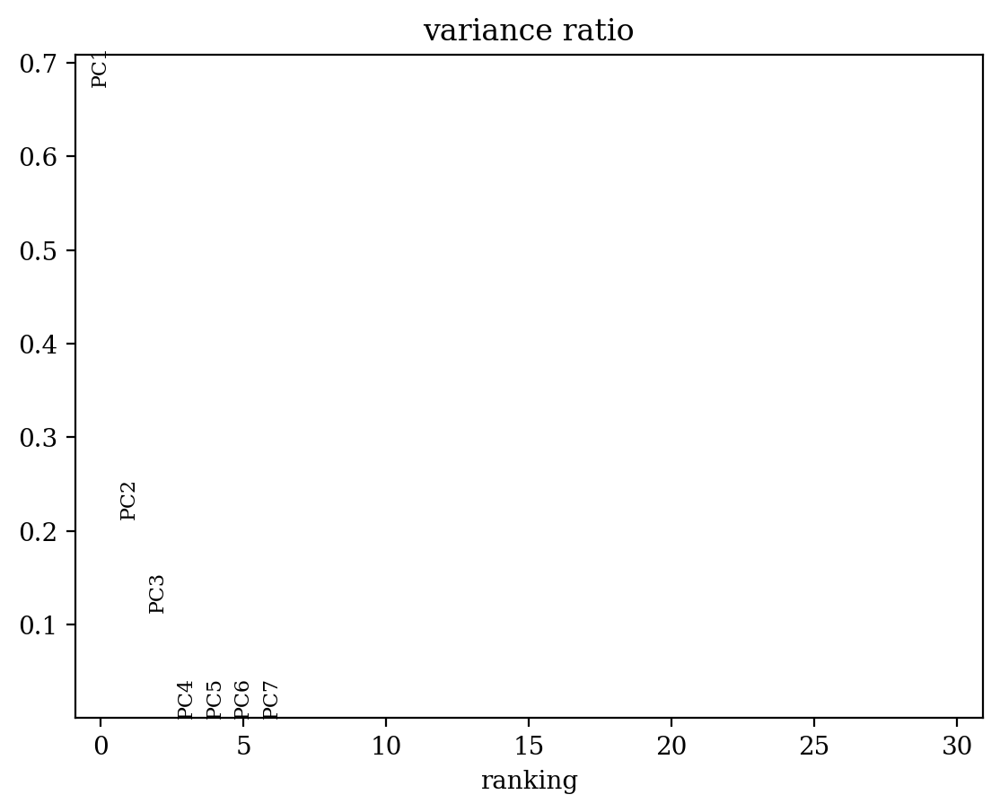

In [102]:
sc.pl.pca_overview(latent,
    color="age",
    color_map="inferno"
)

In [103]:
from tardis._modelplotting import ModelPlotting

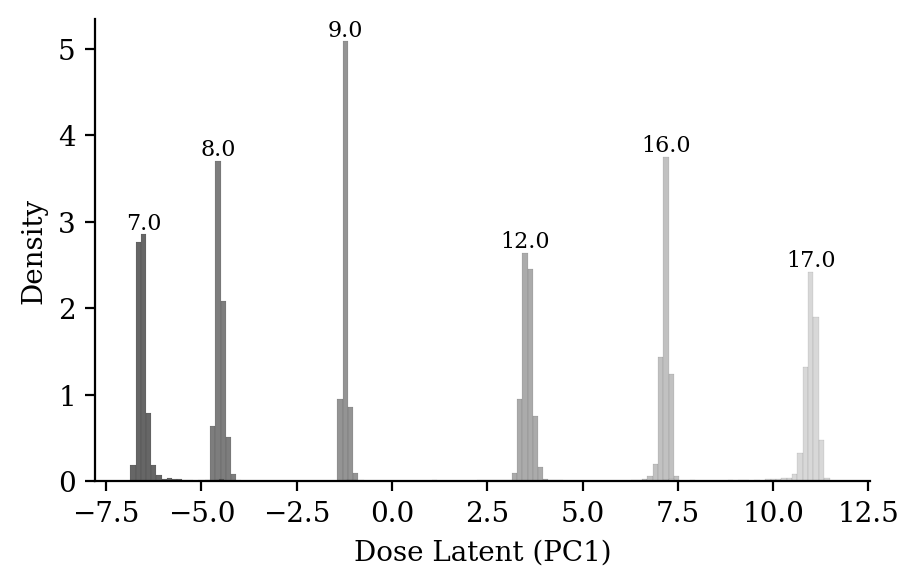

In [104]:
plt.figure(figsize=(5,3))
bins = 128
doses = sorted(latent.obs["age_categorical"].astype(float).unique())
palette = ModelPlotting.generate_gray_tones(len(doses))
for ind, d in enumerate(doses):
    d = str(d)
    __latent = latent[latent.obs["age_categorical"] == d]
    ax = sns.histplot(__latent.obsm["X_pca"][:, 0], bins=bins, stat="density", label=d, color=palette[ind], linewidth=0.025)

    # Calculate histogram data manually to find the peak
    data = __latent.obsm["X_pca"][:, 0]
    counts, bin_edges = np.histogram(data, bins=bins, density=True)
    max_index = np.argmax(counts)  # Index of the peak
    max_value = counts[max_index]  # Peak value
    max_bin_center = (bin_edges[max_index] + bin_edges[max_index + 1]) / 2  # Center of the bin
    
    # Annotate the peak
    plt.text(max_bin_center, max_value, d, horizontalalignment='center', verticalalignment='bottom', fontsize=8)
    
plt.gca().set_xlabel("Dose Latent (PC1)")
sns.despine()
plt.show()

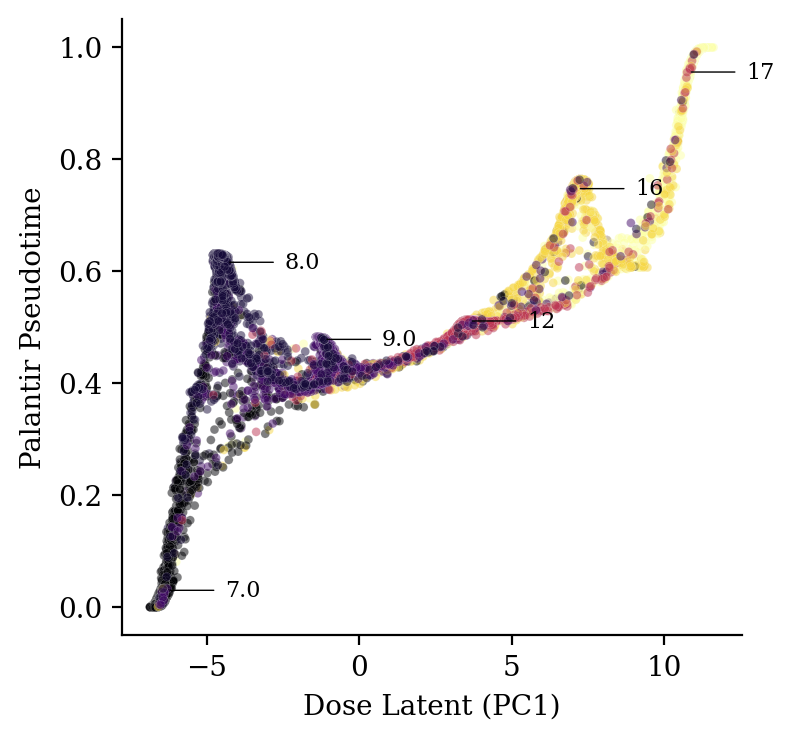

In [105]:
plt.figure(figsize=(4,4))
latent.obs["pca1"] = latent.obsm["X_pca"][:, 0].copy()
_latent = latent.copy()
# _latent = latent.copy()[vae.train_indices]
palette = ModelPlotting.generate_gray_tones(len(_latent.obs["age_categorical"].unique()))

# Scatter plot
ax = sns.scatterplot(data=_latent.obs, x="pca1", y="palantir_pseudotime", s=10, alpha=0.5, linewidth=0.1, hue="age", palette="inferno")

# Calculate means for each dose and annotate
groups = _latent.obs.groupby('age')
for name, group in groups:
    mean_pca1 = group['pca1'].mean()
    mean_pseudotime = group['palantir_pseudotime'].mean()
    
    # Find non-overlapping positions for text annotations
    # Adjust these offsets based on your data's distribution and scale        
    text_pos_x = mean_pca1 + np.std(_latent.obs["pca1"]) / 2 - 0.75
    text_pos_y = mean_pseudotime + np.std(_latent.obs["palantir_pseudotime"]) / 2
    
    ax.annotate(f'{(name if float(name) <10 else int(name))}', xy=(mean_pca1, mean_pseudotime), xytext=(text_pos_x, mean_pseudotime),
                 arrowprops=dict(facecolor='black', arrowstyle='-', connectionstyle='arc3', lw=0.5), ha='left', va='center', fontsize=8)

sns.despine()
plt.xlabel("Dose Latent (PC1)")
plt.ylabel("Palantir Pseudotime")
ax.get_legend().remove()
plt.show()


In [106]:
latent

AnnData object with n_obs × n_vars = 73697 × 8
    obs: 'sample_ID', 'organ', 'age', 'cell_type', 'sex', 'sex_inferred', 'concatenated_integration_covariates', 'integration_donor', 'integration_biological_unit', 'integration_sample_status', 'integration_library_platform_coarse', 'n_genes', 'age_categorical', 'age_training', '_scvi_batch', '_scvi_labels', 'palantir_pseudotime', 'palantir_entropy', 'pca1'
    uns: 'pca', 'DM_EigenValues', 'neighbors', 'umap', 'age_categorical_colors', 'cell_type_colors', 'palantir_waypoints'
    obsm: 'X_pca', 'DM_EigenVectors', 'DM_EigenVectors_multiscaled', 'X_umap', 'palantir_fate_probabilities'
    varm: 'PCs'
    obsp: 'DM_Kernel', 'DM_Similarity', 'distances', 'connectivities'

In [107]:
_a = sorted(latent.uns.keys())
for _i in _a:
    if _i.endswith("_colors"):
        del latent.uns[_i]

In [108]:
with pd.option_context('display.max_rows', None):
    k = adata.obs.groupby(["cell_type", "age"]).size()
    display(k[k>0])

cell_type                              age 
B1 cells                               9.0       37
                                       16.0      34
CD4 T                                  16.0     173
                                       17.0      88
CD5- mature B                          9.0       59
                                       16.0     111
                                       17.0     156
CD8 T                                  16.0      46
CMP                                    8.0       53
                                       9.0       48
                                       12.0      38
Cycling DC                             7.0       44
                                       8.0       96
                                       9.0       41
                                       12.0      39
                                       16.0      49
                                       17.0      32
Cycling ILC                            8.0       69
                    

In [137]:
_adata = adata.copy()
_adata.obs = latent.obs.copy()
_adata.uns = latent.uns.copy()
_adata.obsm = latent.obsm.copy()
_adata.obsp = latent.obsp.copy()

_adata.X = vae.get_normalized_expression().values

_adata = _adata[_adata.obs["pca1"].sort_values().index,:]
# _adata = _adata[_adata.obs["cell_type"] == "NK"]
sc.pp.scale(_adata)
zzarr = _adata.X
zzarr.shape, _adata.shape



/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


((73697, 8192), (73697, 8192))

In [138]:
palatte = ModelPlotting.generate_gray_tones(2)

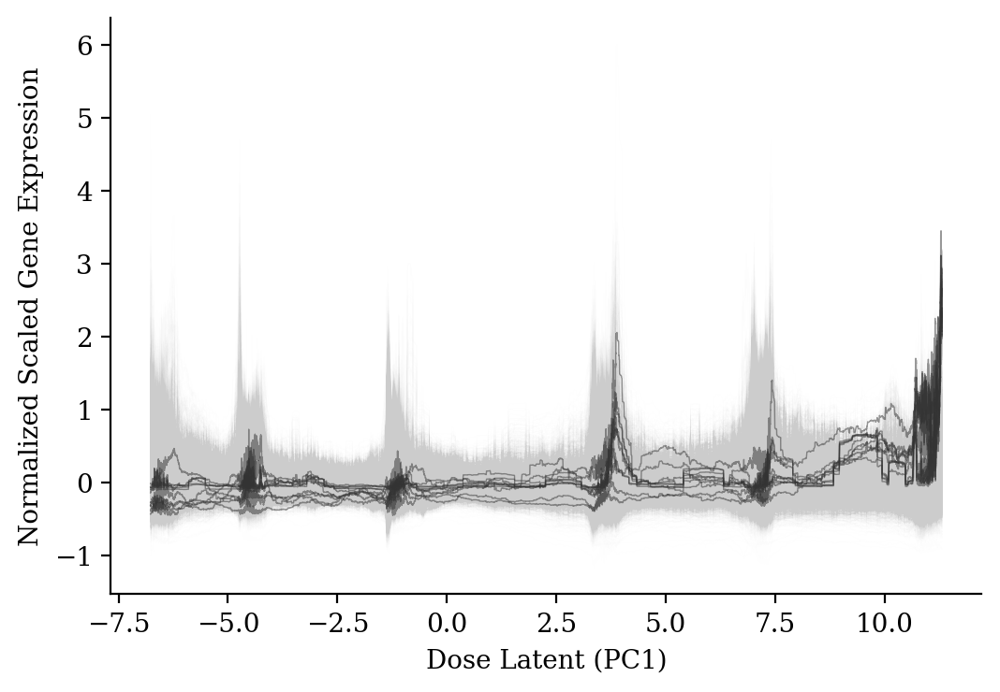

(['C1QTNF9B',
  'C4A',
  'CFAP70',
  'ENSG00000283148.1',
  'EPGN',
  'LHX6',
  'LINC00159',
  'PGM5',
  'PLA2R1',
  'RSPO3',
  'SLC26A10P'],
 [0.9755510546899107, 98.0, 2.0])

In [139]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import norm
from scipy.signal import convolve
from scipy.signal.windows import gaussian

# Constants
THR = 2.  # Threshold for filtering gene expression
GENE = _adata.shape[1]  # Number of genes
MAC = 2**7  # Window size for moving average calculation

cumulative_probability = norm.cdf(2.25)
confidence_interval = 2 * cumulative_probability - 1
high_confidence = round(confidence_interval, 2) * 100
low_confidence = 100 - high_confidence

# Creating a Gaussian window
window = gaussian(MAC, std=MAC)
window /= window.sum()

# Calculating the length of the convolution output for moving average
output_length = len(zzarr) - MAC + 1

# Creating a boolean mask for slicing the array
mask = np.zeros(len(zzarr), dtype=bool)
mask[int((MAC - 1)/2):int((MAC - 1)/2) + output_length] = True

# Initializing the plot with specified figure size
plt.figure(figsize=(6, 4))
texts = []  # List to store gene names that are prominently visible

x=_adata.obs["pca1"][mask]
# First pass: Plot the moving average for each gene expression array where the values are within the threshold
for i in range(GENE):
    ma = convolve(zzarr[:, i], window, mode='valid')
    sign = np.any((THR > ma[-1]) & (-THR < ma[-1]))
    if sign:
        plt.plot(x, ma, linewidth=0.25, color=palatte[1], alpha=0.01)

# Second pass: Plot and highlight gene expressions that exceed the threshold
for i in range(GENE):
    ma = convolve(zzarr[:, i], window, mode='valid')
    sign = np.any((THR > ma[-1]) & (-THR < ma[-1]))
    if not sign:
        plt.plot(x, ma, linewidth=0.5, color=palatte[0], alpha=0.5)
        texts.append(_adata.var["hgnc"][i])  # Storing gene names

plt.ylabel("Normalized Scaled Gene Expression")
plt.xlabel("Dose Latent (PC1)")
# plt.xticks([])  # Hiding x-axis ticks for better clarity
sns.despine()
plt.show()

sorted(texts), [confidence_interval, high_confidence, low_confidence]

- C1QTNF9B - C1Ql4 - stemmness (https://www.ncbi.nlm.nih.gov/pmc/articles/PMC10265994/)
- PLA2R1 - senescence (https://www.ncbi.nlm.nih.gov/pmc/articles/PMC10652324/)
- RSPO3 - determinant of liver zonation (https://www.sciencedirect.com/science/article/pii/S2211124715012383)
- EPGN - liver assiciated (https://www.sciencedirect.com/science/article/pii/S092544391730371X)
- C4a - fibrosis (https://www.ncbi.nlm.nih.gov/pmc/articles/PMC3767844/)
- PGM5 - liver caancer biomarker (PGM5: a novel diagnostic and prognostic biomarker for liver cancer)

In [140]:
_adata = adata.copy()
_adata.obs = latent.obs.copy()
_adata.uns = latent.uns.copy()
_adata.obsm = latent.obsm.copy()
_adata.obsp = latent.obsp.copy()

_adata.X = vae.get_normalized_expression().values

_adata = _adata[_adata.obs["pca1"].sort_values().index,:]
_adata = _adata[_adata.obs["cell_type"] == "Mid erythroid"]
sc.pp.scale(_adata)
zzarr = _adata.X
zzarr.shape, _adata.shape

/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


((15756, 8192), (15756, 8192))

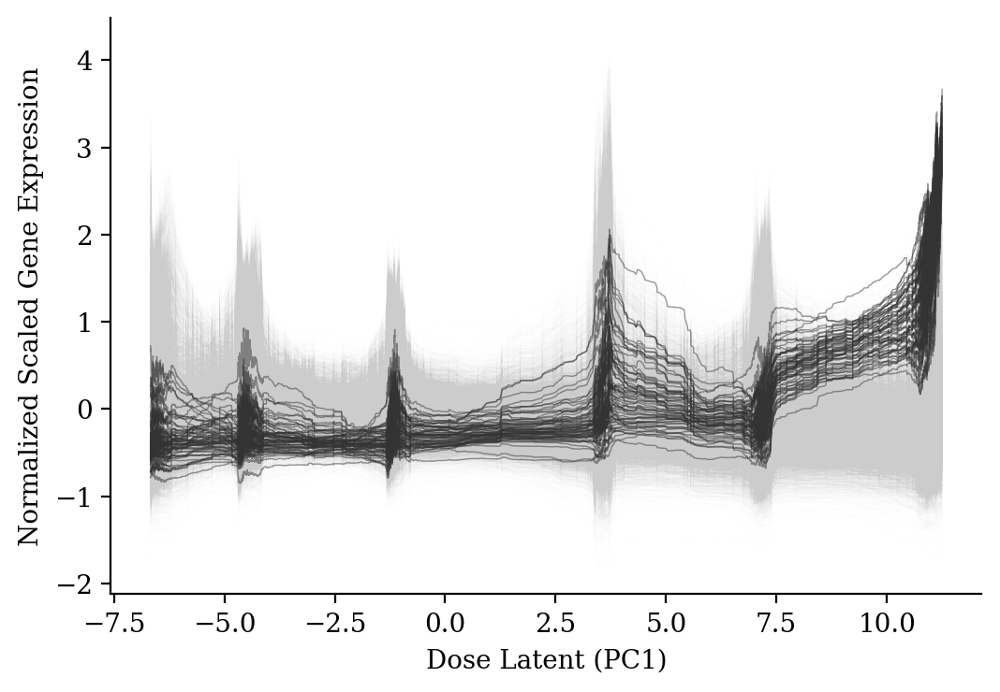

(['ANGPTL8',
  'ARPC4-TTLL3',
  'ATP6AP1L',
  'BHMT',
  'C4A',
  'CEL',
  'CFAP70',
  'CLEC18B',
  'CRADD-AS1',
  'DDHD1-DT',
  'DGKK',
  'ENSG00000225411.3',
  'ENSG00000228863.8',
  'ENSG00000230387.5',
  'ENSG00000230805.8',
  'ENSG00000232006.9',
  'ENSG00000233251.8',
  'ENSG00000244055.2',
  'ENSG00000250371.1',
  'ENSG00000254420.1',
  'ENSG00000257894.2',
  'ENSG00000261734.1',
  'ENSG00000270124.1',
  'ENSG00000272444.1',
  'ENSG00000273138.1',
  'ENSG00000274422.1',
  'ENSG00000275638.1',
  'ENSG00000275720.1',
  'ENSG00000284999.1',
  'ENSG00000286145.2',
  'EPGN',
  'F8A3',
  'FADS6',
  'FAM66A',
  'FGL1',
  'GHRLOS',
  'HIF1A-AS1',
  'INSYN2B',
  'L3MBTL4',
  'LAMA3',
  'LEMD1-AS1',
  'LINC00159',
  'LINC00221',
  'LINC01139',
  'LINC02137',
  'LINC02666',
  'LINC02895',
  'MEGF9',
  'MIR4422HG',
  'MMP12',
  'MSH4',
  'PCDHGB3',
  'PDE11A',
  'PGR',
  'PRKAA2',
  'PYY',
  'RAB6C',
  'SCUBE3-AS1',
  'SPP2',
  'TCF4-AS2',
  'TEX41',
  'THRB',
  'TRERNA1',
  'TRIM55',
  'TTC

In [142]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import norm
from scipy.signal import convolve
from scipy.signal.windows import gaussian

# Constants
THR = 2.75  # Threshold for filtering gene expression
GENE = _adata.shape[1]  # Number of genes
MAC = 2**7  # Window size for moving average calculation

cumulative_probability = norm.cdf(2.25)
confidence_interval = 2 * cumulative_probability - 1
high_confidence = round(confidence_interval, 2) * 100
low_confidence = 100 - high_confidence

# Creating a Gaussian window
window = gaussian(MAC, std=MAC)
window /= window.sum()

# Calculating the length of the convolution output for moving average
output_length = len(zzarr) - MAC + 1

# Creating a boolean mask for slicing the array
mask = np.zeros(len(zzarr), dtype=bool)
mask[int((MAC - 1)/2):int((MAC - 1)/2) + output_length] = True

# Initializing the plot with specified figure size
plt.figure(figsize=(6, 4))
texts = []  # List to store gene names that are prominently visible

x=_adata.obs["pca1"][mask]
# First pass: Plot the moving average for each gene expression array where the values are within the threshold
for i in range(GENE):
    ma = convolve(zzarr[:, i], window, mode='valid')
    sign = np.any((THR > ma[-1]) & (-THR < ma[-1]))
    if sign:
        plt.plot(x, ma, linewidth=0.25, color=palatte[1], alpha=0.01)

# Second pass: Plot and highlight gene expressions that exceed the threshold
for i in range(GENE):
    ma = convolve(zzarr[:, i], window, mode='valid')
    sign = np.any((THR > ma[-1]) & (-THR < ma[-1]))
    if not sign:
        plt.plot(x, ma, linewidth=0.5, color=palatte[0], alpha=0.5)
        texts.append(_adata.var["hgnc"][i])  # Storing gene names

plt.ylabel("Normalized Scaled Gene Expression")
plt.xlabel("Dose Latent (PC1)")
# plt.xticks([])  # Hiding x-axis ticks for better clarity
sns.despine()
plt.show()

sorted(texts), [confidence_interval, high_confidence, low_confidence]

In [121]:
scipy.stats.spearmanr(latent.obs["pca1"], latent.obs["age_training"])

SignificanceResult(statistic=0.9590634412629567, pvalue=0.0)

In [122]:
scipy.stats.pearsonr(latent.obs["pca1"], latent.obs["age_training"])

PearsonRResult(statistic=0.9794474362152069, pvalue=0.0)

In [125]:
scipy.stats.spearmanr(latent.obs["pca1"], latent.obs["age"])

SignificanceResult(statistic=0.9590634412629567, pvalue=0.0)

In [126]:
scipy.stats.pearsonr(latent.obs["pca1"], latent.obs["age"])

PearsonRResult(statistic=0.9702231079717833, pvalue=0.0)

In [127]:
scipy.stats.pearsonr(latent.obs["pca1"], latent.obs["palantir_pseudotime"])

PearsonRResult(statistic=0.7284755879147792, pvalue=0.0)

In [128]:
scipy.stats.spearmanr(latent.obs["pca1"], latent.obs["palantir_pseudotime"])

SignificanceResult(statistic=0.4990363613802379, pvalue=0.0)